[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/WidedCHERIF/Detection-using-Detectron2/tree/test/PKLot_dataset.ipynb)





Install Detectron2

In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 5.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=a105b1fe2fe65b18ac05fbabe21ded1c47bfc0aa00f026ca53a31228bc56e6a8
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 963 kB/s 
     |████████████████████████████████| 130 kB 5.4 MB/s 
     |████████████████████████████████| 147 kB 43.2 MB/s 
     |████████████████████████████████| 50 kB 6.1 MB/s 
     |████████████████████████████████| 74 kB 3.3 MB/s 
     |████████████████████████████████| 749 kB 48.6 MB/s 
     |████████████████████████████████

Setup Detectron2 and install important libraries

In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In this section, we train detectron2 on custom dataset following the Tutorial: https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=tjbUIhSxUdm_ 

We use the balloon segmentation dataset which only has one class: balloon. We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.


Prepare dataset

In [3]:
!curl -L "https://public.roboflow.com/ds/gPbookuOTI?key=kfody3xy1u" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: train/2013-02-26_18_49_40_jpg.rf.c1eef7b65c0ed923ae06dbb061f196ec.jpg  
 extracting: train/2013-02-28_17_55_44_jpg.rf.ad44deba4e9cde52deb94231ad08fcdb.jpg  
 extracting: train/2013-02-28_18_10_44_jpg.rf.936d3fd30bd7da00d27994511c6a5fac.jpg  
 extracting: train/2013-02-28_18_20_45_jpg.rf.13435b67a7e0e57486133b88971ccc0a.jpg  
 extracting: train/2013-02-28_18_35_45_jpg.rf.2e805c0b4ea593bd4e96cd963b7c16b2.jpg  
 extracting: train/2013-02-28_18_40_45_jpg.rf.82aac71416c286b8b24b22f2c450f9b4.jpg  
 extracting: train/2013-03-01_17_43_00_jpg.rf.5156dec72ce62742222ed5190f646021.jpg  
 extracting: train/2013-03-01_17_53_00_jpg.rf.8f10861ebe9ce688376a83583786e9a3.jpg  
 extracting: train/2013-03-01_18_03_01_jpg.rf.0f590f1dd5b0d144f592ae9eec4b1d42.jpg  
 extracting: train/2013-03-01_18_08_01_jpg.rf.daa9fb09dfe7d91d9051921a1bb9449e.jpg  
 extracting: train/2013-03-01_18_13_01_jpg.rf.9e7b6916d2d0e1197a287d37b8f29f7b.jpg  
 extracting: t

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("PKLot_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("PKLot_test", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("PKLot_valid", {}, "/content/test/_annotations.coco.json", "/content/test")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:


[04/20 11:31:39 d2.data.datasets.coco]: Loading /content/train/_annotations.coco.json takes 3.48 seconds.
WARNING [04/20 11:31:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/20 11:31:39 d2.data.datasets.coco]: Loaded 8691 images in COCO format from /content/train/_annotations.coco.json


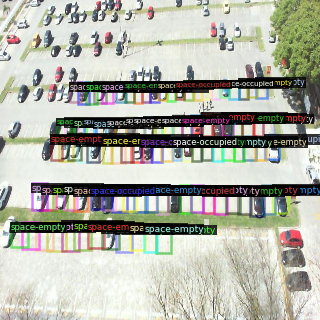

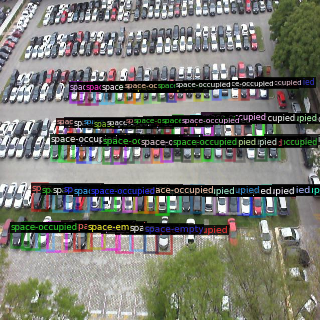

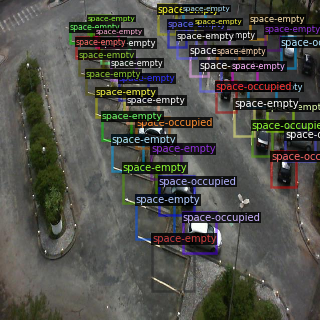

In [5]:
dataset_dicts = DatasetCatalog.get("PKLot_train")
for d in random.sample(dataset_dicts, 3):
    #print(d)
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get("PKLot_train"), scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

Train using a coco pretrained model

In [8]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("PKLot_train",)
cfg.DATASETS.TEST = ("PKLot_valid",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 700    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/20 11:38:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[04/20 11:38:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[04/20 11:38:48 d2.utils.events]:  eta: 0:10:38  iter: 19  total_loss: 2.947  loss_cls: 1.099  loss_box_reg: 0.1201  loss_rpn_cls: 1.227  loss_rpn_loc: 0.2547  time: 0.9452  data_time: 0.0250  lr: 7.0289e-06  max_mem: 2989M
[04/20 11:39:06 d2.utils.events]:  eta: 0:10:05  iter: 39  total_loss: 2.388  loss_cls: 1.053  loss_box_reg: 0.3178  loss_rpn_cls: 0.7955  loss_rpn_loc: 0.2389  time: 0.9340  data_time: 0.0123  lr: 1.4165e-05  max_mem: 2989M
[04/20 11:39:25 d2.utils.events]:  eta: 0:09:50  iter: 59  total_loss: 2.136  loss_cls: 0.9438  loss_box_reg: 0.4803  loss_rpn_cls: 0.3692  loss_rpn_loc: 0.2317  time: 0.9307  data_time: 0.0096  lr: 2.13e-05  max_mem: 2989M
[04/20 11:39:43 d2.utils.events]:  eta: 0:09:30  iter: 79  total_loss: 1.61  loss_cls: 0.7918  loss_box_reg: 0.4173  loss_rpn_cls: 0.2605  loss_rpn_loc: 0.2143  time: 0.9288  data_time: 0.0086  lr: 2.8436e-05  max_mem: 2989M
[04/20 11:40:02 d2.utils.events]:  eta: 0:09:23  iter: 99  total_loss: 1.46  loss_cls: 0.661  loss_box

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

Inference and Evaluation using the new pretrained model

In [12]:
#create a predictor

# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[04/20 12:07:45 d2.data.datasets.coco]: Loading /content/valid/_annotations.coco.json takes 1.23 seconds.
WARNING [04/20 12:07:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/20 12:07:45 d2.data.datasets.coco]: Loaded 2483 images in COCO format from /content/valid/_annotations.coco.json


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


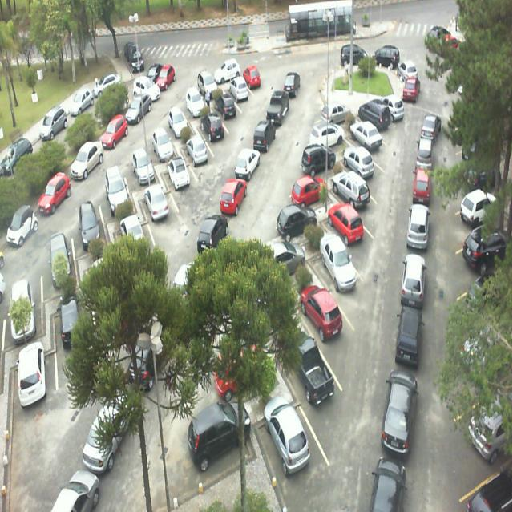

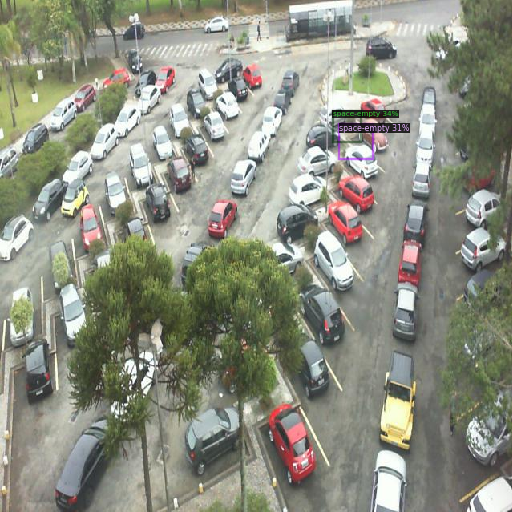

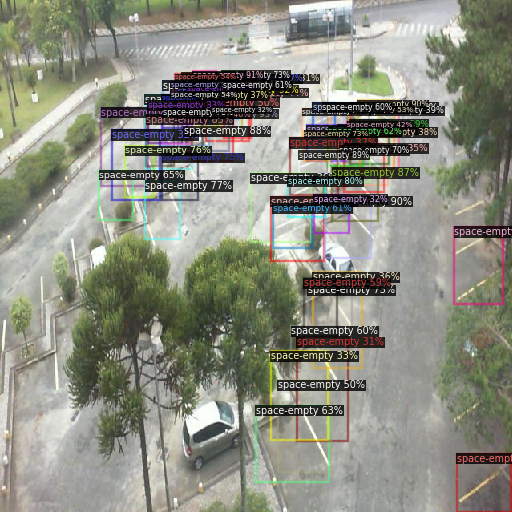

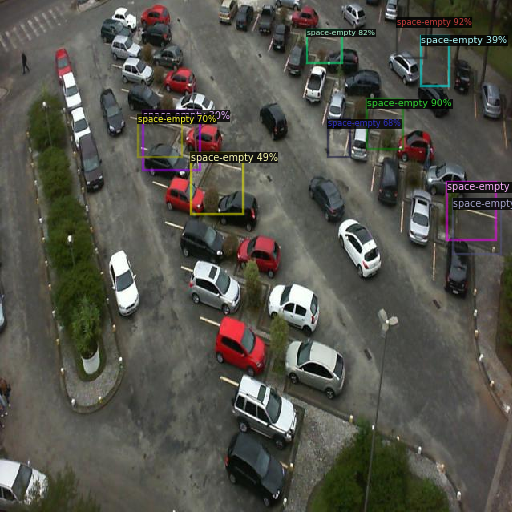

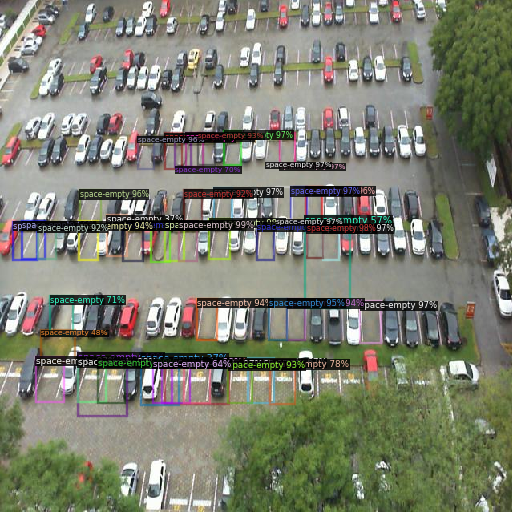

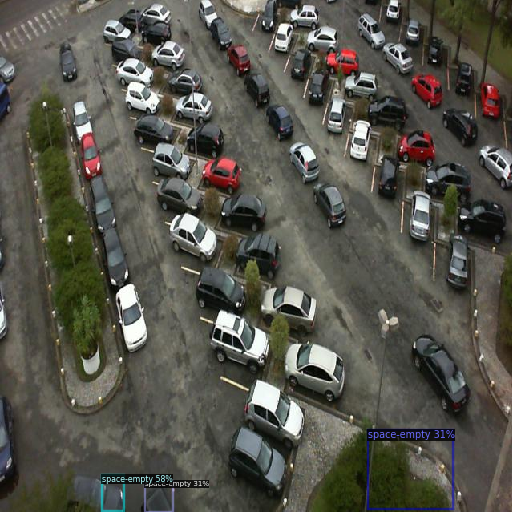

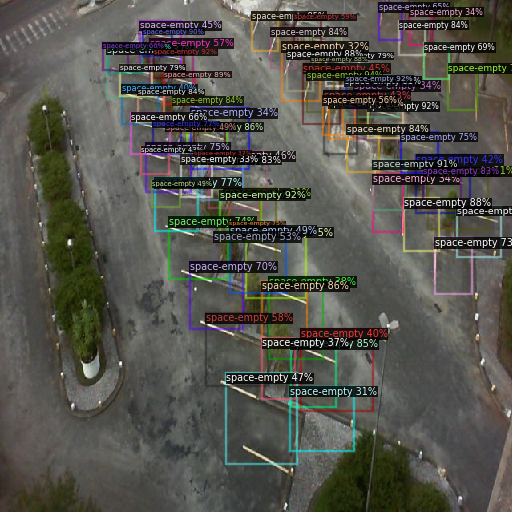

In [16]:
#visualise the results of some validation images

from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("PKLot_test")
for d in random.sample(dataset_dicts, 7):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("PKLot_test"), 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE 
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO AP

In [15]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("PKLot_test", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "PKLot_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[04/20 11:54:56 d2.data.datasets.coco]: Loading /content/valid/_annotations.coco.json takes 1.11 seconds.
WARNING [04/20 11:54:56 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/20 11:54:56 d2.data.datasets.coco]: Loaded 2483 images in COCO format from /content/valid/_annotations.coco.json
[04/20 11:54:57 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category   | #instances   |   category    | #instances   |
|:----------:|:-------------|:-----------:|:-------------|:-------------:|:-------------|
|   spaces   | 0            | space-empty | 73629        | space-occup.. | 69687        |
|            |              |             |              |               |              |
|   total    | 143316       |             |              |               |              |
[04/20 11:54:57 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEd

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[04/20 11:55:00 d2.evaluation.evaluator]: Inference done 11/2483. Dataloading: 0.0019 s/iter. Inference: 0.2831 s/iter. Eval: 0.0004 s/iter. Total: 0.2855 s/iter. ETA=0:11:45
[04/20 11:55:06 d2.evaluation.evaluator]: Inference done 29/2483. Dataloading: 0.0023 s/iter. Inference: 0.2838 s/iter. Eval: 0.0004 s/iter. Total: 0.2866 s/iter. ETA=0:11:43
[04/20 11:55:11 d2.evaluation.evaluator]: Inference done 47/2483. Dataloading: 0.0024 s/iter. Inference: 0.2842 s/iter. Eval: 0.0004 s/iter. Total: 0.2871 s/iter. ETA=0:11:39
[04/20 11:55:16 d2.evaluation.evaluator]: Inference done 65/2483. Dataloading: 0.0023 s/iter. Inference: 0.2839 s/iter. Eval: 0.0004 s/iter. Total: 0.2867 s/iter. ETA=0:11:33
[04/20 11:55:21 d2.evaluation.evaluator]: Inference done 83/2483. Dataloading: 0.0022 s/iter. Inference: 0.2839 s/iter. Eval: 0.0004 s/iter. Total: 0.2867 s/iter. ETA=0:11:27
[04/20 11:55:26 d2.evaluation.evaluator]: Inference done 101/2483. Dataloading: 0.0022 s/iter. Inference: 0.2839 s/iter. Eval